In [26]:
import pandas as pd 
import json 
import matplotlib.pyplot as plt
import numpy as np

In [27]:
asset_names = [
    "ACWI.World.Equities", "AGGG.World.Debt", "AHYG.Asia.Debt", "BWX.World.Debt",
    "EDIV.EmergingMarkets.Equities", "EEM.EmergingMarkets.Equities", "EFA.World.Equities",
    "EFAS.World.Dividend.Equities", "EMB.EmergingMarkets.Debt", "EPP.Pacific_ex_Japan.Equities",
    "EWC.Canada.Equities", "EWG.Europe.Equities", "EWJ.Japan.Equities", "EWU.Europe.Equities",
    "EWZ.Brazil.Equities", "FXI.China.Equities", "GHYG.World.Debt", "GLD.World.Commodities",
    "GOVT.US.Debt", "HYG.US.Debt", "IHYG.Europe.Debt", "IGOV.World.Debt", "INDA.India.Equities",
    "IWM.US.Equities", "IEV.Europe.Equities", "IEF.US.Debt", "JNK.US.Debt", "LQD.US.Debt",
    "PSP.World.PrivateEquity", "REET.World.Alternative", "SAUS.Australia.Equities",
    "SDY.US.Dividend.Equities", "SPY.US.Equities", "TLT.US.Debt", "URTH.World.Equities",
    "VEU.World.Equities", "VTI.US.Equities", "VWOB.EmergingMarkets.Debt"
]

In [28]:
def process_weights(json_data):
    results = {}

    for timestamp, data in json_data.items():
    
        weights = data.get('optimal_weights', [])
        expected_return = data.get('expected_return', None)
        scr_risk = data.get('SCR_risk', None)
        risk_measure = data.get('risk_measure', None)

        weights = np.array(weights)

        normalized_weights = weights / np.sum(weights)

        weighted_return = np.sum(normalized_weights * expected_return)

        results[timestamp] = {
            'normalized_weights': normalized_weights.tolist(),
            'expected_return': expected_return,
            'scr_risk': scr_risk,
            'risk_measure': risk_measure,
            'weighted_return': weighted_return
        }

    return results


with open('../optimization_results.json', 'r') as f:
    json_data = json.load(f)

results = process_weights(json_data)

for timestamp, result in results.items():
    print(f"Timestamp: {timestamp}")
    print(f"Normalized Weights: {result['normalized_weights']}")
    print(f"Expected Return: {result['expected_return']}")
    print(f"SCR Risk: {result['scr_risk']}")
    print(f"Risk Measure: {result['risk_measure']}")
    print(f"Weighted Return: {result['weighted_return']}\n")

Timestamp: 2024-10-16T22:24:24.169334
Normalized Weights: [1.9644542882857628e-13, 2.742577553133344e-16, 4.676499081555597e-16, 1.2798723003918594e-13, 4.5087731637292495e-14, 6.537602757411278e-14, 2.3839368923138564e-16, 1.181827915207967e-16, 1.394417366416106e-17, 8.202789679632697e-15, 2.283040608654865e-15, 2.9013071559877507e-16, 3.013524001018387e-16, 1.6071919028162884e-16, 0.9999999999994273, 3.620456994198966e-15, 9.821659115968501e-14, 5.040422070561357e-16, 2.665070568130882e-15, 1.904857330279229e-16, 7.854042207123891e-16, 1.6244112721868763e-15, 2.1414844625447925e-15, 9.29414939365465e-16, 2.1005979080536757e-16, 4.667548104194206e-16, 5.853143633413424e-16, 3.0751192990740638e-15, 2.957178558383909e-16, 1.9557322241689797e-16, 1.5082111249153944e-16, 1.544282499740524e-16, 1.4556070802952163e-15, 4.843235507210598e-16, 6.958570092432556e-16, 1.9888116951742532e-15, 4.75706028665733e-17, 4.78575050745888e-15]
Expected Return: 0.0004606817938193296
SCR Risk: -856.19790

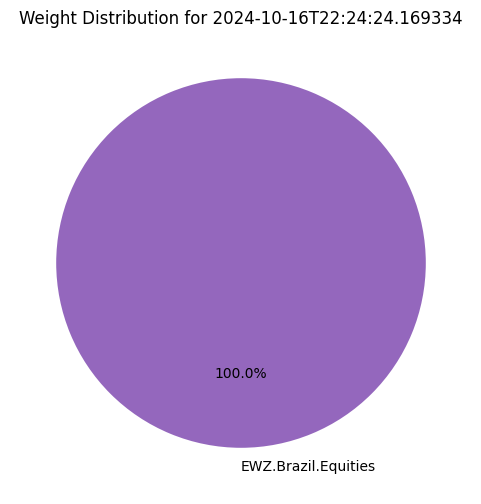

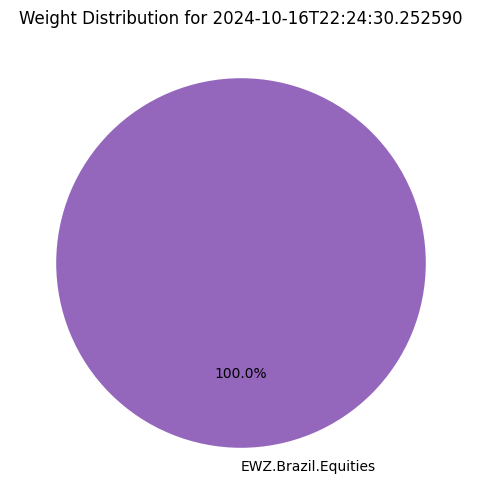

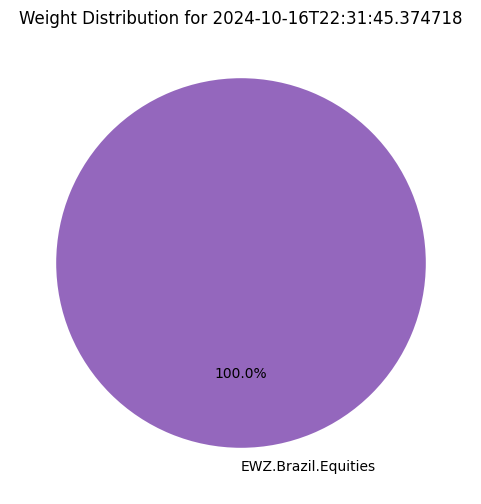

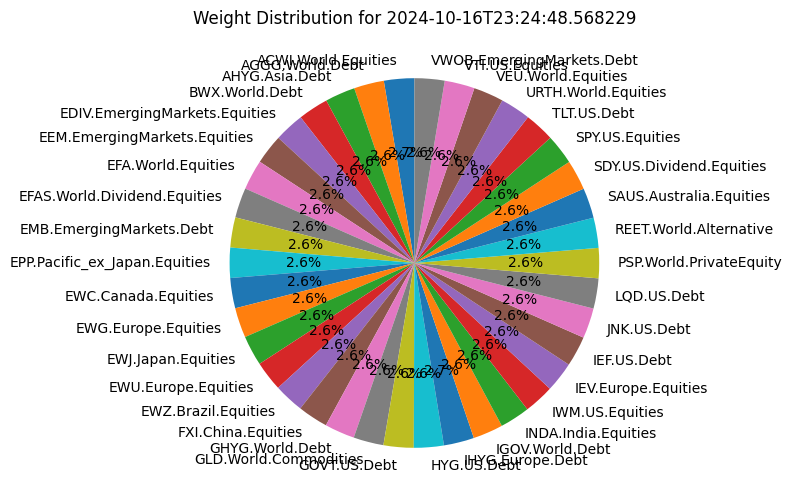

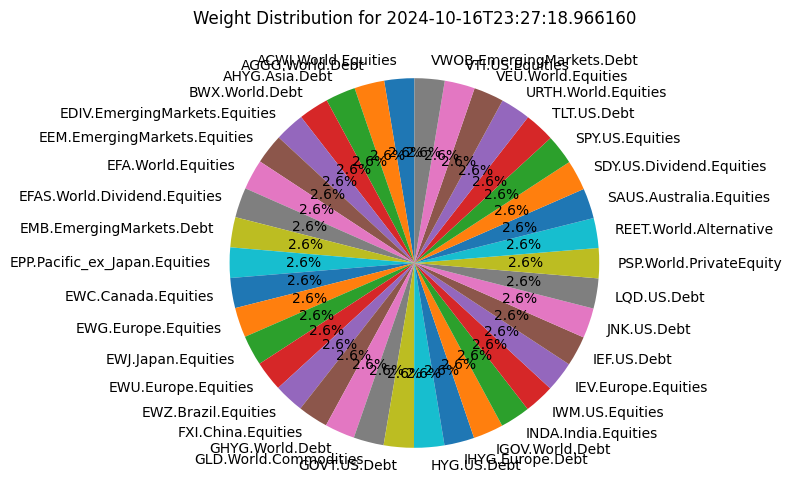

...

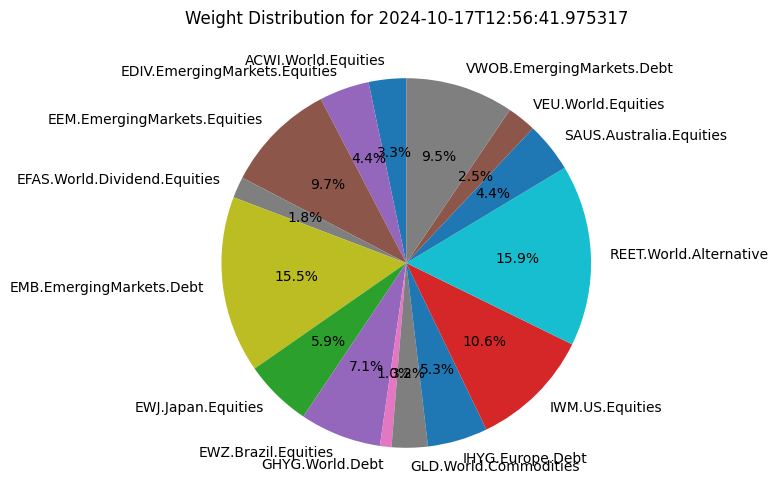

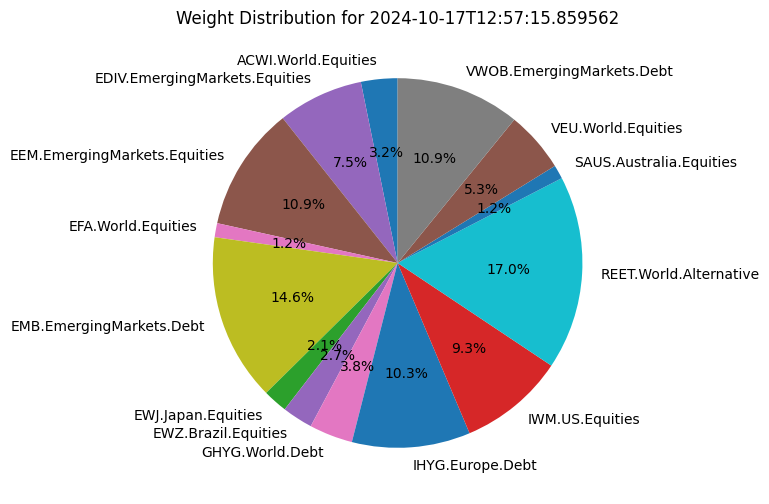

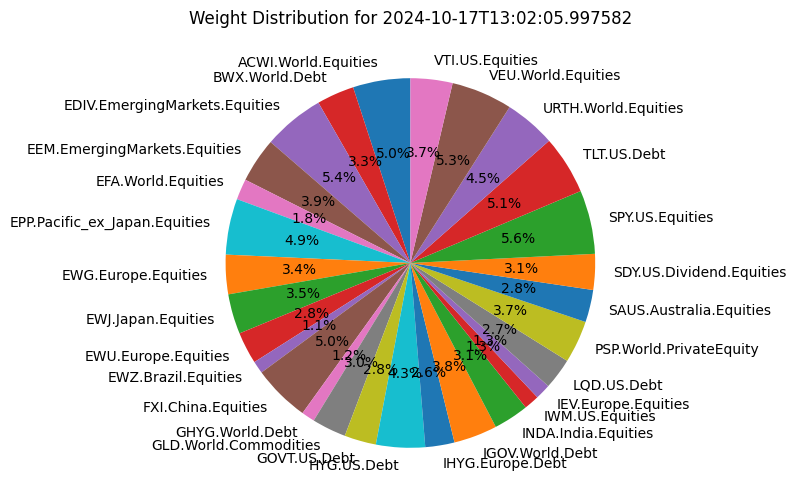

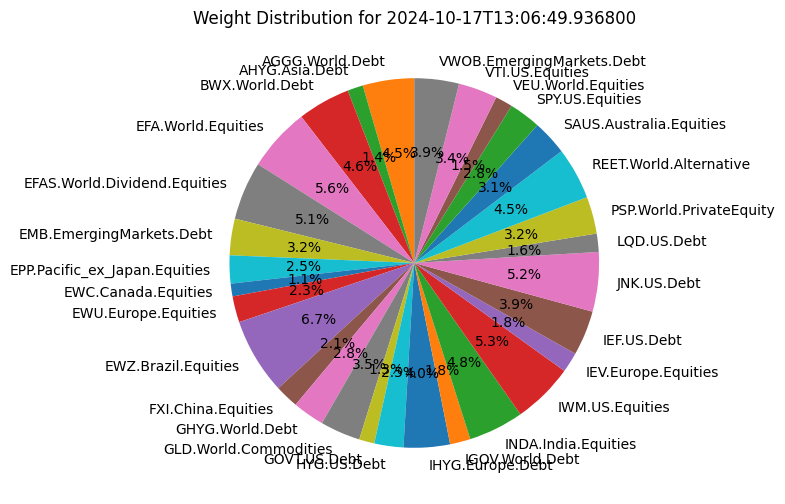

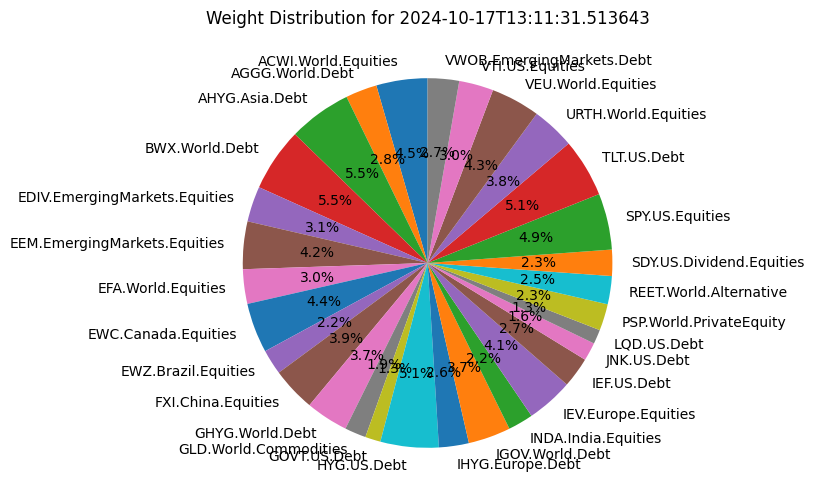

In [31]:
def plot_weight_distribution(results, threshold=0.01):
    
    for timestamp, result in results.items():
        normalized_weights = result['normalized_weights']

        filtered_weights = [weight if weight >=
                            threshold else 0 for weight in normalized_weights]
        filtered_labels = [name if weight >= threshold else '' for name, weight in zip(
            asset_names, normalized_weights)]

        plt.figure(figsize=(6, 6))
        plt.pie(filtered_weights, labels=filtered_labels,
                autopct=lambda p: f'{p:.1f}%' if p > 0 else '', startangle=90)


        plt.title(f'Weight Distribution for {timestamp}')
        plt.show()


plot_weight_distribution(results)